<a href="https://colab.research.google.com/github/SosaGabriel/DataScience/blob/main/SuperMarket.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Contexto**

El crecimiento de los supermercados en la mayoría de las ciudades pobladas está aumentando y la competencia en el mercado también es alta. El conjunto de datos es una de las ventas históricas de la empresa de supermercados que ha registrado datos en 3 sucursales diferentes durante 3 meses. Los métodos de análisis de datos predictivos son fáciles de aplicar con este conjunto de datos.

<p align=center>
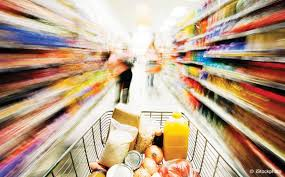</p>


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import missingno as msno
import plotly.express as px
import plotly.graph_objs as go
import plotly.io as pio
from plotly.subplots import make_subplots
import calendar
from geopy.geocoders import Nominatim
from geopy.distance import geodesic
import folium
from folium import plugins
import ipywidgets
from branca.element import Figure

# Plotly Options and Config

pio.templates.default = 'plotly_white'
config = {'displayModeBar': False}
colors_x = ['#E0C95A', '#CBE0CA', '#E0864E', '#CDCCE3', '#E3B8D1']
cmaps = 'Blues'


%matplotlib inline
#!pip install sweetviz

# Información de atributos

**Identificación de la factura:** Número de identificación de la factura del comprobante de venta generado por computadora  
**Sucursal:** Sucursal del supercentro (hay 3 sucursales disponibles identificadas con A, B y C).  
**Ciudad:** Ubicación de los supercentros  
**Tipo de cliente:** Tipo de clientes, registrados por Miembros para clientes que usan tarjeta de miembro y Normal para sin tarjeta de miembro.
**Género:** Género tipo de cliente  
**Línea de productos**: Grupos de categorización de artículos generales - Accesorios electrónicos, Accesorios de moda, Alimentos y bebidas, Salud y belleza, Hogar y estilo de vida, Deportes y viajes  
**Precio unitario**: Precio de cada producto en $  
**Cantidad:** Número de productos comprados por cliente  
**Impuesto**: tasa de impuesto del 5% por compra del cliente  
**Total:** Precio total con impuestos incluidos  
**Fecha:** Fecha de compra (Registro disponible de enero de 2019 a marzo de 2019)  
**Hora:** Hora de compra (10 a.m. a 9 p.m.)  
**Pago:** Pago utilizado por el cliente para la compra (hay 3 métodos disponibles: efectivo, tarjeta de crédito y billetera electrónica)
**COGS:** costo de los bienes vendido  
**Porcentaje de margen bruto:** Porcentaje de margen  
**Ingresos brutos:** Ingresos brutos  
**Calificación:** Calificación de estratificación del cliente en su experiencia de compra general (en una escala del 1 al 10)

# **Propósito**
Este conjunto de datos se puede utilizar con fines de análisis de datos predictivos.

## Data Analysis and Data Cleaning

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving supermarket_sales - Sheet1_.csv to supermarket_sales - Sheet1_.csv


In [ ]:
data= pd.read_csv('/content/supermarket_sales - Sheet1_.csv')

In [ ]:
print("Data: \t\nVarialbes: \t{}\nEntradas:\t{}".format(data.shape[1],data.shape[0]))

Data: 	
Varialbes: 	17
Entradas:	1000


In [ ]:
print("Contienen "+ str(data.shape[0])+" filas y "+str(data.shape[1])+" columnas \n")
print(data.columns)

NameError: ignored

In [ ]:
data.info()
print(" ")
print("Variables Numéricas:")
for i in data.select_dtypes(exclude = ['object']):
    print("\t\t"+i)
    

print("Variables con Texto:")
for i in data.select_dtypes(include = ['object']):
    print("\t\t"+i)
    

print("Variables con Nulos")
missing_val_count = (data.isnull().sum())
print(missing_val_count[missing_val_count > 0])


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Invoice ID               1000 non-null   object 
 1   Branch                   1000 non-null   object 
 2   City                     1000 non-null   object 
 3   Customer type            1000 non-null   object 
 4   Gender                   1000 non-null   object 
 5   Product line             1000 non-null   object 
 6   Unit price               1000 non-null   float64
 7   Quantity                 1000 non-null   int64  
 8   Tax 5%                   1000 non-null   float64
 9   Total                    1000 non-null   float64
 10  Date                     1000 non-null   object 
 11  Time                     1000 non-null   object 
 12  Payment                  1000 non-null   object 
 13  cogs                     1000 non-null   float64
 14  gross margin percentage  

In [ ]:
categorical_columns = [cname for cname in data.columns if data[cname].dtype == "object"]
categorical_columns

['Invoice ID',
 'Branch',
 'City',
 'Customer type',
 'Gender',
 'Product line',
 'Date',
 'Time',
 'Payment']

In [ ]:
data.isnull().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

In [ ]:
(data.isnull().sum() / data.shape[0]).sort_values(ascending=False)

Rating                     0.0
Quantity                   0.0
Branch                     0.0
City                       0.0
Customer type              0.0
Gender                     0.0
Product line               0.0
Unit price                 0.0
Tax 5%                     0.0
gross income               0.0
Total                      0.0
Date                       0.0
Time                       0.0
Payment                    0.0
cogs                       0.0
gross margin percentage    0.0
Invoice ID                 0.0
dtype: float64

<Figure size 300x200 with 0 Axes>

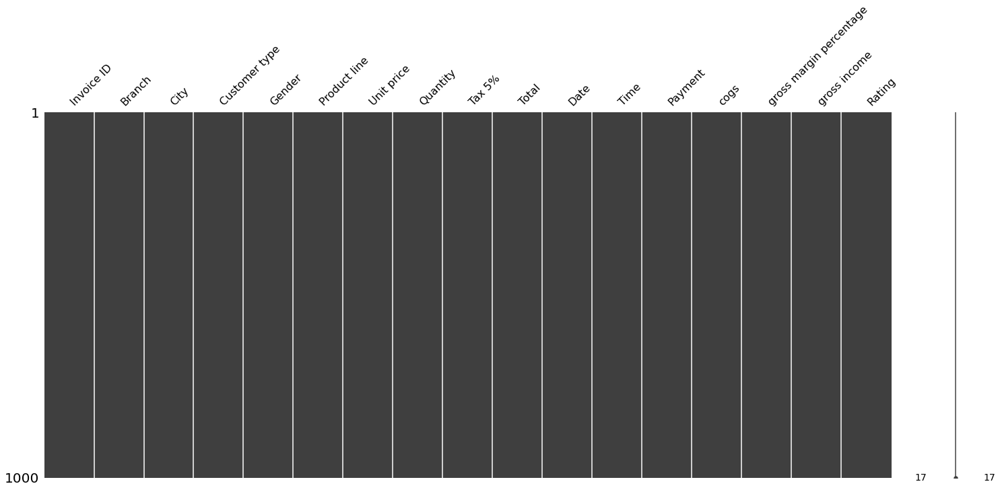

In [ ]:
plt.figure(dpi=50)
msno.matrix(data)

In [ ]:
data.head()
#data.head().T

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [ ]:
print("Resumen:")
print(round(data.describe().transpose(),1))
#pd.options.display.max_columns = None

In [ ]:
data.describe(),1

NameError: ignored

In [ ]:
np.round(data.corr(),1)

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Unit price,1.0,0.0,0.6,0.6,0.6,-0.0,0.6,-0.0
Quantity,0.0,1.0,0.7,0.7,0.7,-0.0,0.7,-0.0
Tax 5%,0.6,0.7,1.0,1.0,1.0,0.0,1.0,-0.0
Total,0.6,0.7,1.0,1.0,1.0,0.0,1.0,-0.0
cogs,0.6,0.7,1.0,1.0,1.0,0.0,1.0,-0.0
gross margin percentage,-0.0,-0.0,0.0,0.0,0.0,1.0,0.0,0.0
gross income,0.6,0.7,1.0,1.0,1.0,0.0,1.0,-0.0
Rating,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,1.0


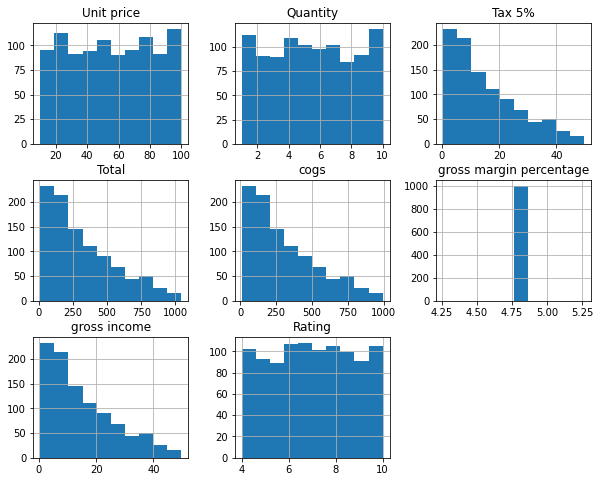

In [ ]:
data.hist(figsize=(10,8));

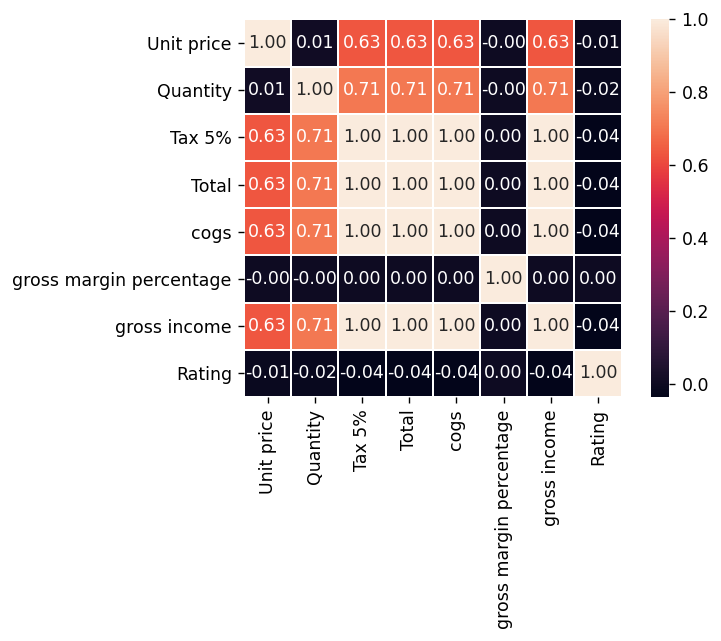

In [ ]:
plt.figure(dpi=125)
sns.heatmap(data.corr(), square = True, linewidths= .5, annot=True, fmt='.2f');
#sns.heatmap(np.round(data.corr(),2),annot=True

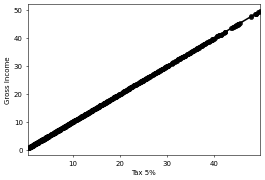

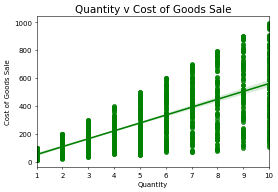

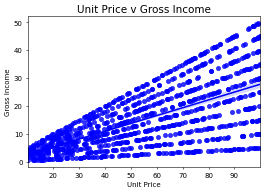

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



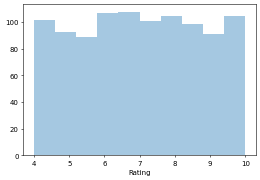

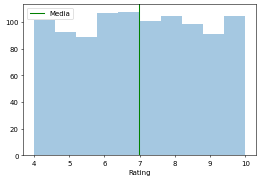

In [ ]:
plt.figure(figsize=(6,4),dpi=50)
sns.regplot(x='Tax 5%',y='gross income',data=data,color='black')
plt.xlabel('Tax 5%')
plt.ylabel('Gross Income')
plt.show()

plt.figure(figsize=(6,4),dpi=50)
sns.regplot(x='Quantity',y='cogs',data=data,color='green')
plt.xlabel('Quantity')
plt.ylabel('Cost of Goods Sale')
plt.title('Quantity v Cost of Goods Sale',fontsize=15)
plt.show()

plt.figure(figsize=(6,4),dpi=50)
sns.regplot(x='Unit price',y='gross income',data=data,color='blue')
plt.xlabel('Unit Price')
plt.ylabel('Gross Income')
plt.title('Unit Price v Gross Income',fontsize=15)
plt.show()

#distribucion del rating
plt.figure(dpi=50) 
sns.distplot(data['Rating'],kde=False)
plt.show()

# La calificación media del rating
plt.figure(dpi=50)
sns.distplot(data['Rating'],kde=False)
plt.axvline(x=np.mean(data['Rating']),c='green',label='Media')
plt.legend()
plt.show()

In [ ]:
def percentage(s):
    """
    Converts a series to round off - percentage string format.
    """
    x = s.apply(lambda x : round(x/s[:].sum() * 100, 2))
    x = x.apply(lambda x : str(x) + '%')
    return x

In [ ]:
plt.figure(dpi=50)
gender_count = data['Gender'].value_counts()
gp = percentage(gender_count)

fig = go.Figure()

fig.add_trace(go.Bar(
    x = gender_count.index,
    y = gender_count,
    text = [f'{gp[0]}👧', f'{gp[1]}👨'],
    textfont = dict(size = 13),
    #marker_color = [blue_shades[5], blue_shades[0]]
))

fig.update_traces(
    textposition = 'outside'
)

fig.update_layout(
    xaxis_title = '<b>Gender</b>',
    yaxis_title = 'Count',
    title = '<b>Gender:</b> Male and Female Count',
    autosize = False,
    height = 600,
)

fig.show()

<Figure size 300x200 with 0 Axes>

Branch A - 340
Branch B - 328
Branch C - 332


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



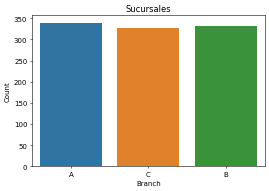

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



E-wallet - 345
Cash - 344
Credit Card - 311


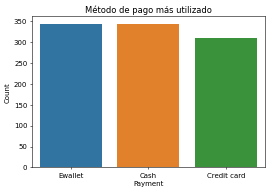

In [ ]:
plt.figure(dpi=50)
sns.countplot(data['Branch'])
plt.xlabel('Branch')
plt.ylabel('Count')
plt.title('Sucursales')
A,B,C =data.Branch.value_counts()

print('Branch A -',A)
print('Branch B -',C)
print('Branch C -',B)
plt.show()


plt.figure(dpi=50)
sns.countplot(data['Payment'])
plt.xlabel('Payment')
plt.ylabel('Count')
plt.title('Método de pago más utilizado')
A,B,C =data.Payment.value_counts()

print('E-wallet -',A)
print('Cash -',B)
print('Credit Card -',C)
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



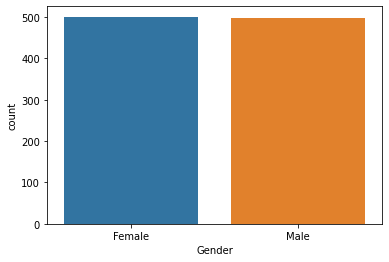

In [ ]:
plt.figure(figsize=(6,4))
sns.countplot(data['Gender'])



Text(0.5, 1.0, 'Ratings by Branch')

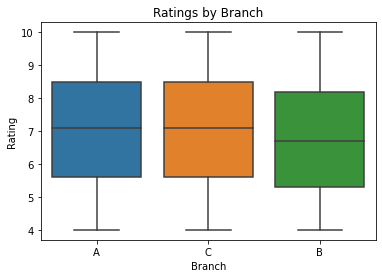

In [ ]:
sns.boxplot(x="Branch", y = "Rating" ,data =data).set_title("Ratings by Branch")

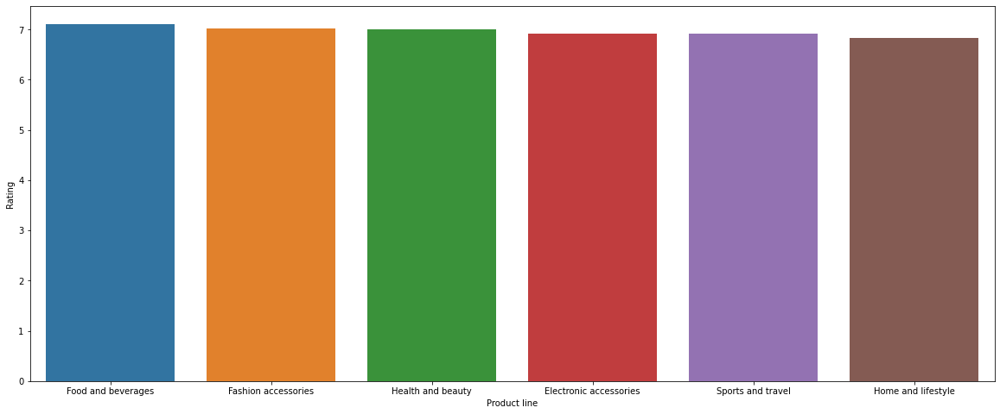

In [ ]:
cat=data[["Product line", "Rating"]].groupby(['Product line'], as_index=False).mean().sort_values(by='Rating', ascending=False)
plt.figure(figsize=(20,8))

sns.barplot(x='Product line', y='Rating', data=cat)

In [ ]:
codata=data.copy()
codata.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


df['year'] = pd.DatetimeIndex(df['Date']).year  
df['month'] = pd.DatetimeIndex(df['Date']).month  
df['day'] = pd.DatetimeIndex(df['Date']).day  
df['day_of_year'] = pd.DatetimeIndex(df['Date']).dayofyear  
df['week_of_year'] = pd.DatetimeIndex(df['Date']).weekofyear  
df['quarter'] = pd.DatetimeIndex(df['Date']).quarter  
df['season'] = df.month%12 // 3 + 1  

df[['Date', 'year', 'month', 'day', 'day_of_year', 'week_of_year', 'quarter', 'season']].head()  


In [ ]:
codata['date'] = pd.to_datetime(codata['Date'])
codata['date'].dtype
codata['date'] = pd.to_datetime(codata['date'])
codata['day'] = (codata['date']).dt.day
codata['month'] = (codata['date']).dt.month
codata['year'] = (codata['date']).dt.year
del(codata["date"])
codata.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Hour,day,month,year
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,2020-12-26 13:08:00,Ewallet,522.83,4.761905,26.1415,9.1,13,5,1,2019
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,2020-12-26 10:29:00,Cash,76.40,4.761905,3.8200,9.6,10,8,3,2019
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,2020-12-26 13:23:00,Credit card,324.31,4.761905,16.2155,7.4,13,3,3,2019
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,2020-12-26 20:33:00,Ewallet,465.76,4.761905,23.2880,8.4,20,27,1,2019
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,2020-12-26 10:37:00,Ewallet,604.17,4.761905,30.2085,5.3,10,8,2,2019


In [ ]:
codata['Time'] = pd.to_datetime(codata['Time'])
codata['Hour'] = (codata['Time']).dt.hour
codata['Hour'].unique()
#codata['Hour'].nunique()

array([13, 10, 20, 18, 14, 11, 17, 16, 19, 15, 12])

In [ ]:
codata.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Hour,day,month,year
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,2020-12-26 13:08:00,Ewallet,522.83,4.761905,26.1415,9.1,13,5,1,2019
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,2020-12-26 10:29:00,Cash,76.40,4.761905,3.8200,9.6,10,8,3,2019
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,2020-12-26 13:23:00,Credit card,324.31,4.761905,16.2155,7.4,13,3,3,2019
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,2020-12-26 20:33:00,Ewallet,465.76,4.761905,23.2880,8.4,20,27,1,2019
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,2020-12-26 10:37:00,Ewallet,604.17,4.761905,30.2085,5.3,10,8,2,2019


In [ ]:
print("Data: \t\nVarialbes: \t{}\nEntradas:\t{}".format(codata.shape[1],codata.shape[0]))

Data: 	
Varialbes: 	21
Entradas:	1000


In [ ]:
print("# Valores únicos en Branch: {0}".format(len(codata['Branch'].unique().tolist())))
print("# Valores únicos en City: {0}".format(len(codata['City'].unique().tolist())))
print("# Valores únicos en Customer type: {0}".format(len(codata['Customer type'].unique().tolist())))
print("# Valores únicos en Product line type: {0}".format(len(codata['Product line'].unique().tolist())))

# Valores únicos en Branch: 3
# Valores únicos en City: 3
# Valores únicos en Customer type: 2
# Valores únicos en Product line type: 6


In [ ]:
codata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Invoice ID               1000 non-null   object        
 1   Branch                   1000 non-null   object        
 2   City                     1000 non-null   object        
 3   Customer type            1000 non-null   object        
 4   Gender                   1000 non-null   object        
 5   Product line             1000 non-null   object        
 6   Unit price               1000 non-null   float64       
 7   Quantity                 1000 non-null   int64         
 8   Tax 5%                   1000 non-null   float64       
 9   Total                    1000 non-null   float64       
 10  Date                     1000 non-null   object        
 11  Time                     1000 non-null   datetime64[ns]
 12  Payment                  1000 non-n

Text(0.5, 1.0, 'Ventas por hora')

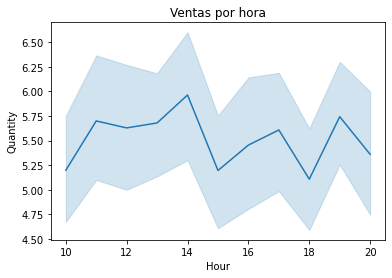

In [ ]:
sns.lineplot(x="Hour",  y = 'Quantity',data = codata).set_title("Ventas por hora")

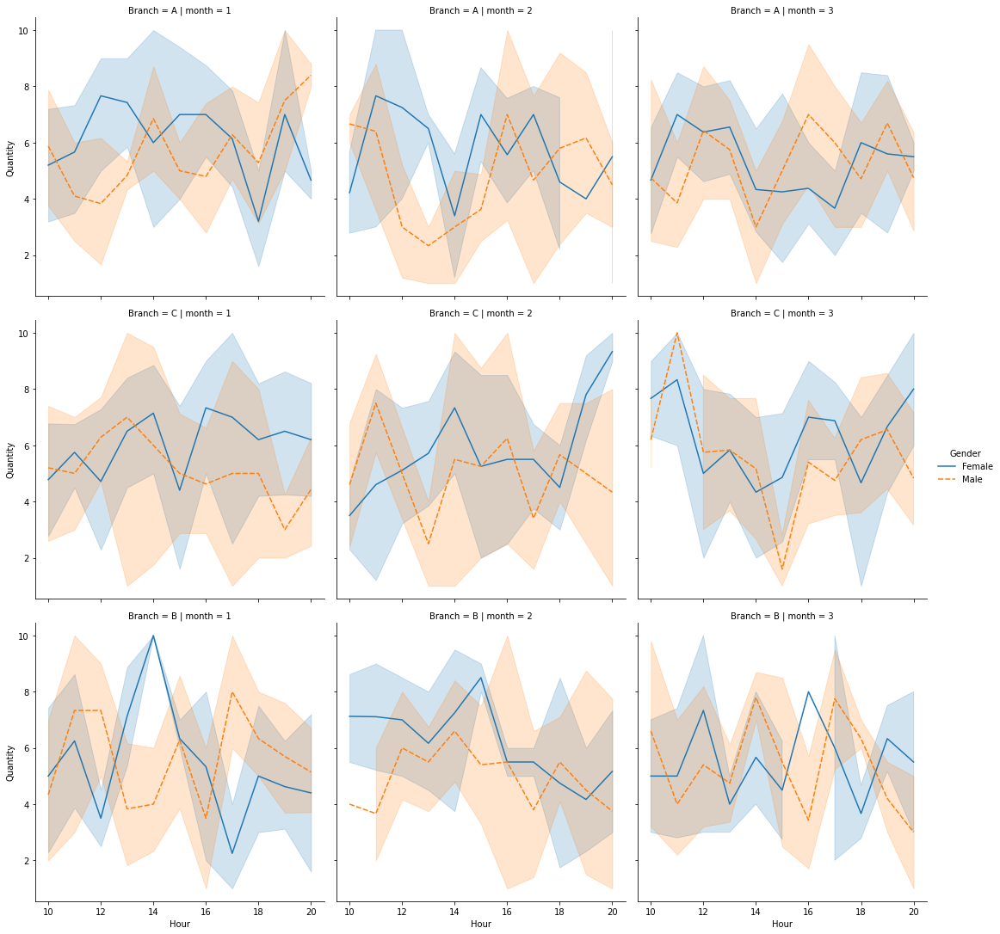

In [ ]:
sns.relplot(x="Hour",  y = 'Quantity', col= 'month' , row= 'Branch', kind="line", hue="Gender", style="Gender", data =codata)

<Figure size 300x200 with 0 Axes>

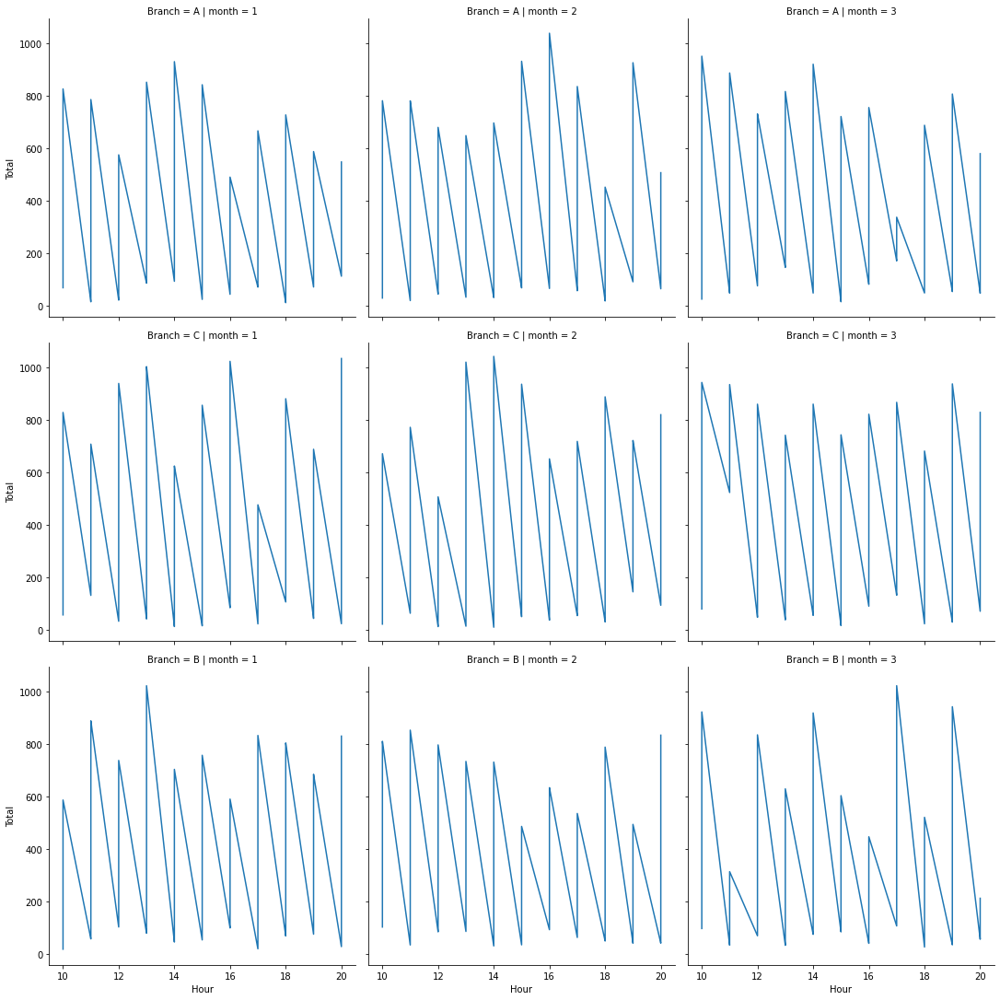

In [ ]:
plt.figure(dpi=50)
sns.relplot(x="Hour",  y = 'Total', col= 'month' , row= 'Branch', estimator = None, kind="line", data =codata)

In [ ]:
long = {"Yangon": 16.8661, "Naypyitaw": 19.7633, "Mandalay": 21.9588 }
lat = {"Yangon": 96.1951, "Naypyitaw": 96.0785, "Mandalay": 96.0891 }
for set in codata:
    codata['long'] = codata['City'].map(long)
    codata['lat'] = codata['City'].map(lat)

Text(0.5, 1.0, 'Customer Type')

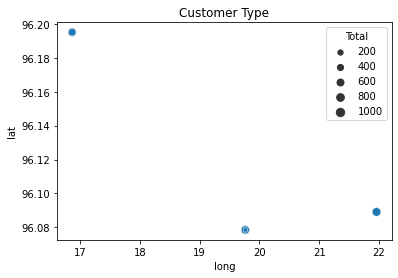

In [ ]:
 sns.scatterplot(x="long",  y = "lat",size = "Total", data =codata, legend = "brief").set_title("Customer Type")

In [ ]:
city_data = codata['City'].unique()
cities = pd.DataFrame(data = city_data, columns = {'Ciudades'})
cities

,Ciudades
0,Yangon
1,Naypyitaw
2,Mandalay


In [ ]:
nom = Nominatim(user_agent='google')

def geo_cities(cities):
    lat = []
    long = []
    flag = 0
    for city in cities['ciudades']:
      location = nom.geocode(city)
      try:
        lat.append(location.latitude)
        long.append(location.longitude)
        print(flag)
      except:
        lat.append('NA')
        long.append('NA')
      flag += 1
    cities['Latitude'] = lat
    cities['Longitude'] = long 

cities = pd.DataFrame({'ciudades': ['Yangon', 'Naypyitaw', 'Mandalay'],
                       'Latitude': [16.79671316,19.690708,21.981275],
                       'Longitude' : [96.160992, 96.165883, 96.082375]})

supermarket_geo = folium.Map(location = [19.680708,	96.265883], zoom_start = 7, tiles = 'CartoDB Positron', control_scale = True)

fig = Figure(width = 800, height = 600)
fig.add_child(supermarket_geo)

for (index, row) in cities.iterrows():
  folium.Marker(location = [row.loc['Latitude'], row.loc['Longitude']], popup = row.loc['ciudades'],tooltip = 'click',
                icon = folium.Icon(icon = 'glyphicon-shopping-cart', prefix = 'glyphicon')).add_to(supermarket_geo)

supermarket_geo

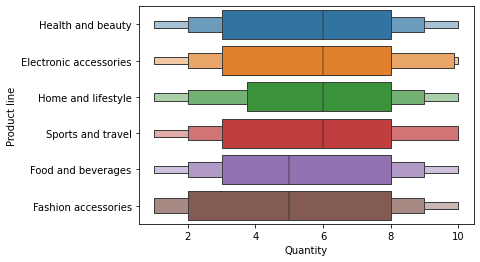

In [ ]:
sns.boxenplot(y = 'Product line', x = 'Quantity', data=codata )


Aquí podemos interpretar que alimentos y bebidas, complementos de moda tienen menos cantidad media, mientras que hemos visto que ambas categorías tienen una calificación alta. Entonces necesitamos aumentar nuestro suministro, amigo.

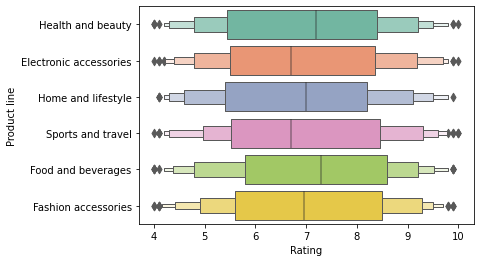

In [ ]:
sns.boxenplot(y = 'Product line', x = 'Rating', data=codata,palette='Set2' )

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 0.98, 'INGRESOS BRUTOS')

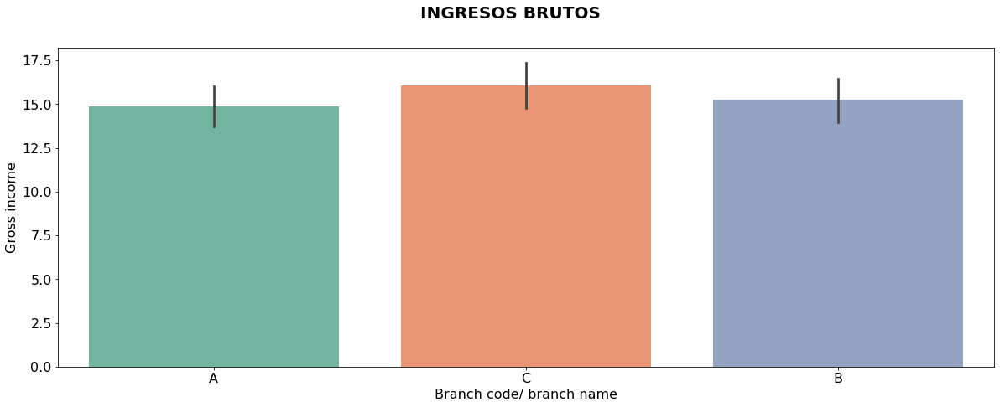

In [ ]:
#INGRESOS BRUTOS
plt.figure(figsize=(20,7))
sns.barplot(codata['Branch'],codata['gross income'],palette='Set2')
plt.xlabel('Branch code/ branch name',fontsize='16')
plt.xticks(fontsize='16')
plt.ylabel('Gross income',fontsize='16')
plt.yticks(fontsize='16')
plt.suptitle("INGRESOS BRUTOS",fontsize='20',fontweight='bold')


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 0.98, 'Most profittable city judgement\n')

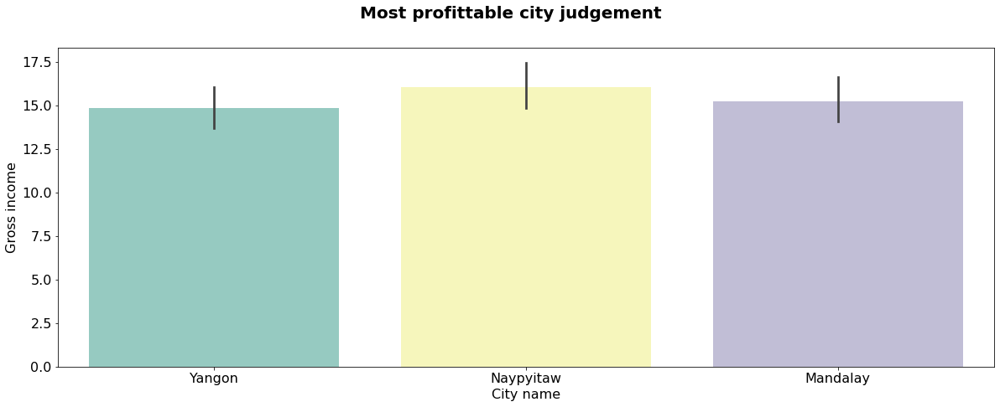

In [ ]:
plt.figure(figsize=(20,7))
sns.barplot(codata['City'],codata['gross income'],palette='Set3')
plt.xlabel('City name',fontsize='16')
plt.xticks(fontsize='16')
plt.ylabel('Gross income',fontsize='16')
plt.yticks(fontsize='16')
plt.suptitle("Most profittable city judgement\n",fontsize='20',fontweight='bold')

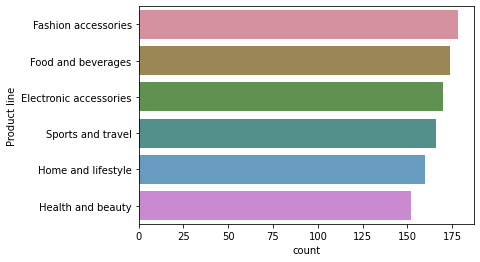

In [ ]:
sns.countplot(y = 'Product line', data=codata, order = codata['Product line'].value_counts().index,palette="husl",saturation=0.50)

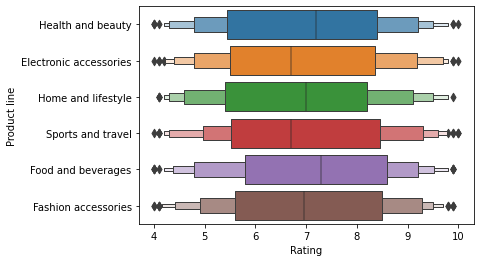

In [ ]:
sns.boxenplot(y = 'Product line', x = 'Rating', data=codata )


Text(0.5, 1.0, 'Payment Channel by Branch')

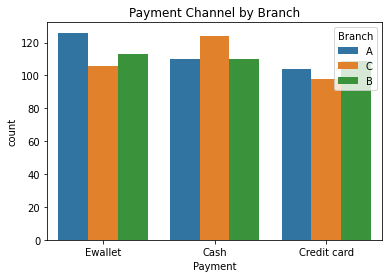

In [ ]:
sns.countplot(x="Payment", hue = "Branch", data =codata).set_title("Payment Channel by Branch")

In [ ]:
codata.groupby(['Customer type']).agg({'Total': 'sum'})

,Total
Customer type,
Member,164223.444
Normal,158743.305


Text(0.5, 1.0, 'Customer Type')

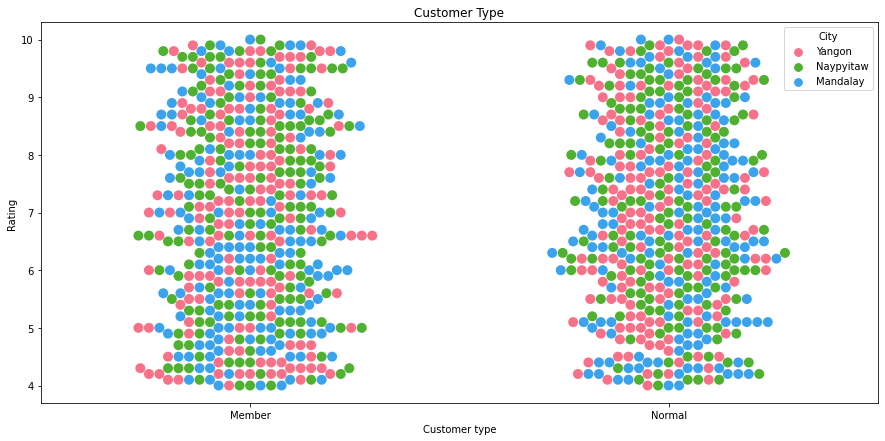

In [ ]:
plt.figure(figsize=(15,7))
sns.swarmplot(x="Customer type",  y = "Rating",  hue = "City", data =codata, size=10,palette="husl").set_title("Customer Type")

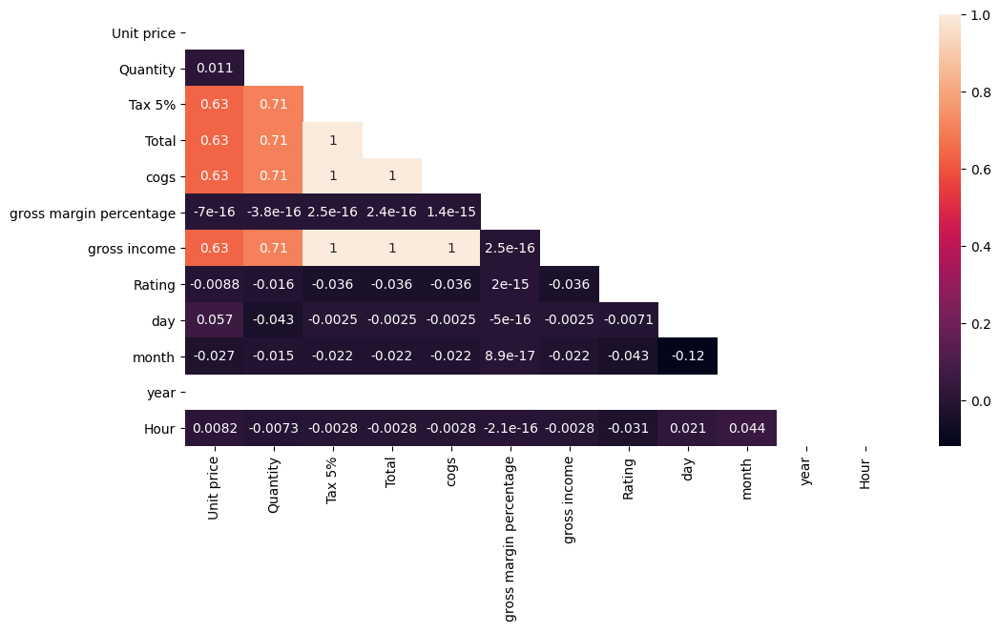

In [ ]:
matrix = np.triu(codata.corr())
plt.figure(figsize=(12,6),dpi=100)
sns.heatmap(codata.corr(), annot=True, mask=matrix)

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X = codata.iloc[:, -8].values.reshape(-1,1)

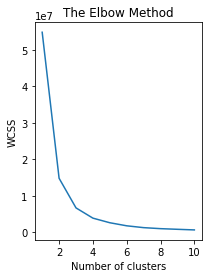

In [ ]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(3,4))
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


The Elbow Method: En el análisis de conglomerados, el método del codo es una heurística utilizada para determinar el número de conglomerados en un conjunto de datos. El método consiste en graficar la variación explicada como una función del número de grupos, y elegir el codo de la curva como el número de grupos para usarEn el análisis de conglomerados, el método del codo es una heurística utilizada para determinar el número de conglomerados en un conjunto de datos. El método consiste en graficar la variación explicada como una función del número de grupos, y elegir el codo de la curva como el número de grupos para usar

In [ ]:
 #Training the K-Means model on the dataset
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(X)

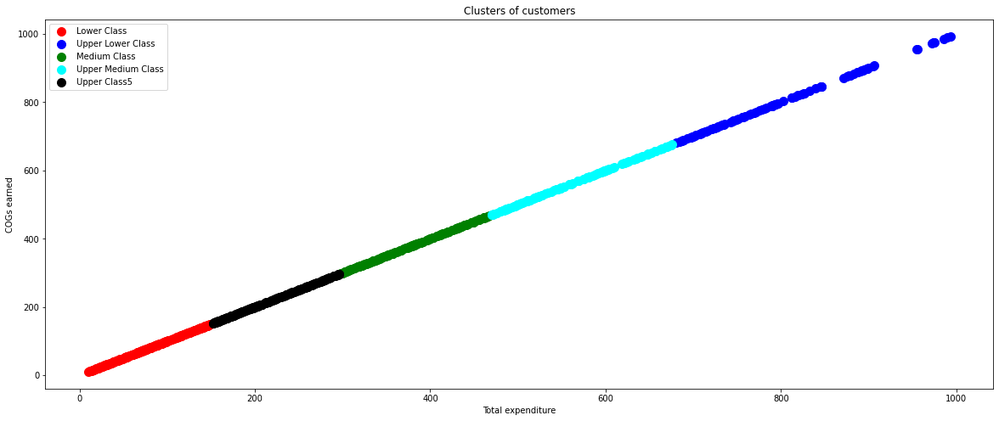

In [ ]:
plt.figure(figsize=(20,8))
plt.scatter(X[y_kmeans == 0,0], X[y_kmeans == 0], s = 100, c = 'red', label = 'Lower Class')
plt.scatter(X[y_kmeans == 1,0], X[y_kmeans == 1], s = 100, c = 'blue', label = 'Upper Lower Class')
plt.scatter(X[y_kmeans == 2,0], X[y_kmeans == 2], s = 100, c = 'green', label = 'Medium Class')
plt.scatter(X[y_kmeans == 3,0], X[y_kmeans == 3], s = 100, c = 'cyan', label = 'Upper Medium Class')
plt.scatter(X[y_kmeans == 4,0], X[y_kmeans == 4], s = 100, c = 'black', label = 'Upper Class5')
plt.title('Clusters of customers')
plt.xlabel('Total expenditure')
plt.ylabel('COGs earned')
plt.legend()
plt.show()

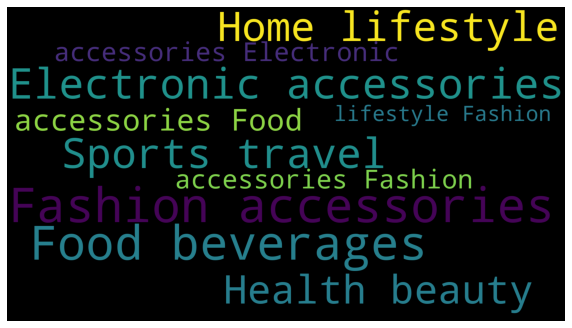

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(10,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(codata["Product line"]))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('cast2.png')
plt.show()

<Figure size 300x200 with 0 Axes>

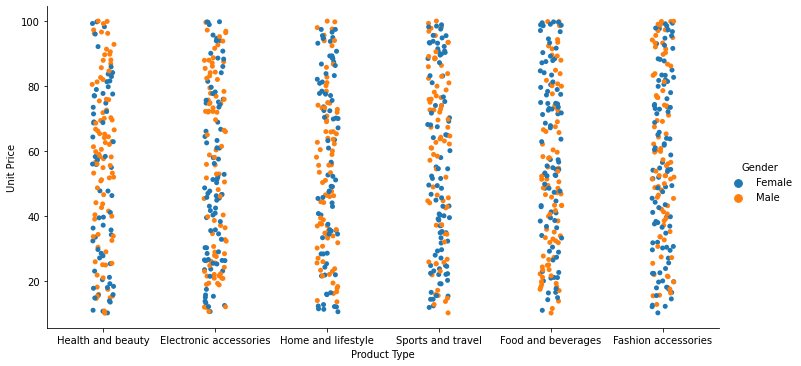

<Figure size 300x200 with 0 Axes>

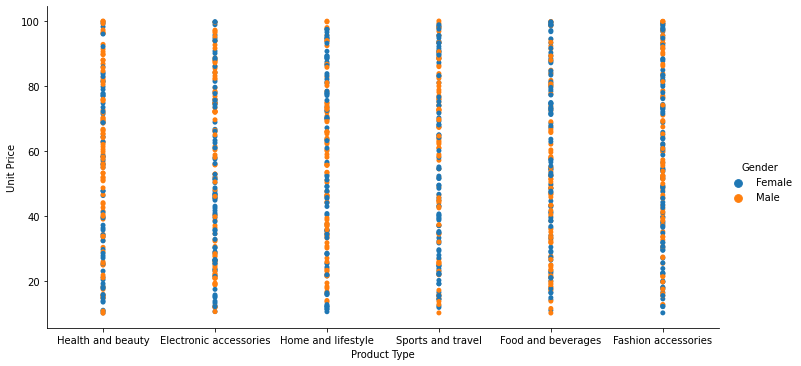

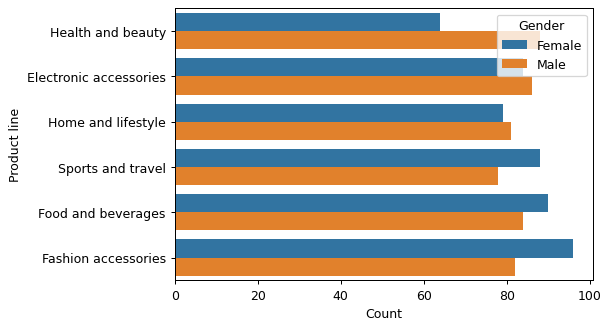

In [ ]:
plt.figure(dpi=50)
sns.catplot(x='Product line',y='Unit price',hue='Gender',data=data,aspect=2)
plt.xlabel('Product Type')
plt.ylabel('Unit Price')
plt.show()

#Mejor relación 
plt.figure(dpi=50)
sns.catplot(x='Product line',y='Unit price',hue='Gender',data=data,aspect=2,jitter=False)
plt.xlabel('Product Type')
plt.ylabel('Unit Price')
plt.show()

plt.figure(dpi=90)
sns.countplot(y='Product line',hue='Gender',data=data)
plt.xlabel('Count')
plt.ylabel('Product line')
plt.show()

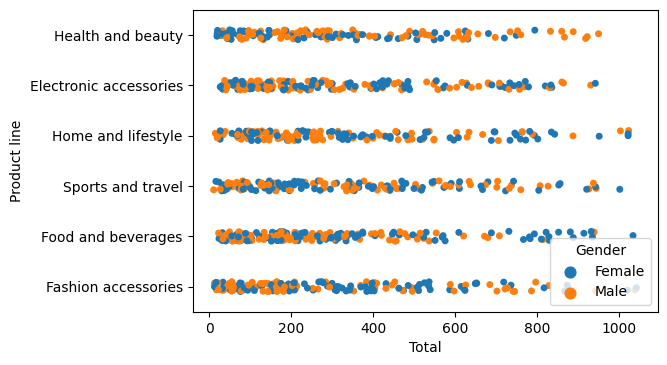

In [ ]:
plt.figure(dpi=100)
sns.stripplot(y = 'Product line', x = 'Total', hue = 'Gender', data=codata )

<Figure size 300x200 with 0 Axes>

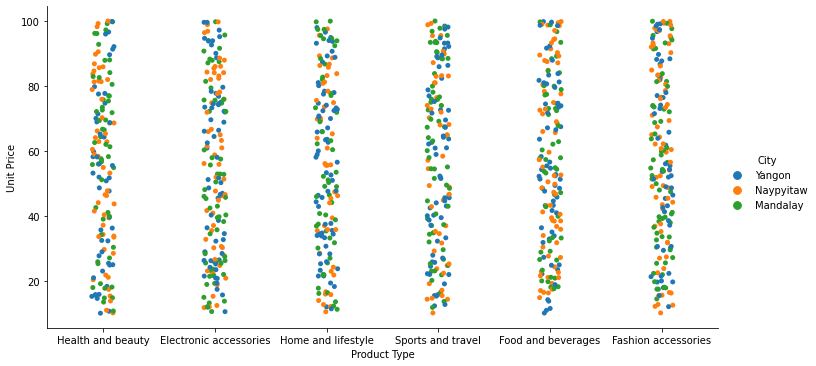

<Figure size 300x200 with 0 Axes>

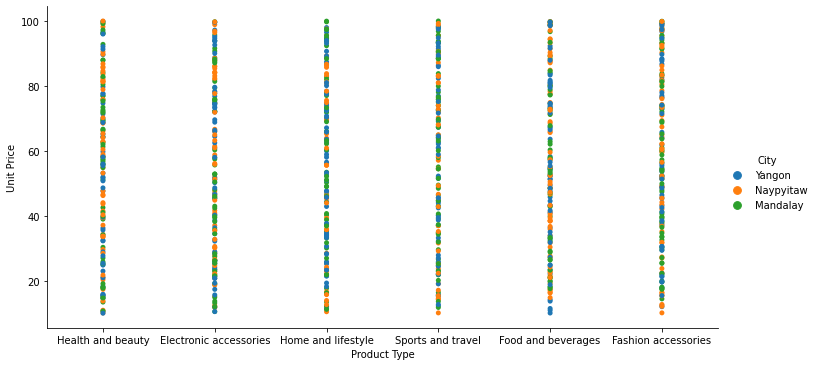

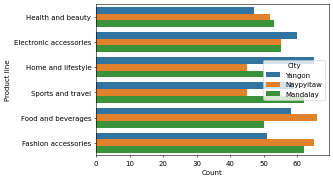

In [ ]:
plt.figure(dpi=50)
sns.catplot(x='Product line',y='Unit price',hue='City',data=data,aspect=2)
plt.xlabel('Product Type')
plt.ylabel('Unit Price')
plt.show()

#Mejor relación 
plt.figure(dpi=50)
sns.catplot(x='Product line',y='Unit price',hue='City',data=data,aspect=2,jitter=False)
plt.xlabel('Product Type')
plt.ylabel('Unit Price')
plt.show()

plt.figure(dpi=50)
sns.countplot(y='Product line',hue='City',data=data)
plt.xlabel('Count')
plt.ylabel('Product line')
plt.show()


Gráfico de Boxen para clasificación y cantidad

¿Qué es Boxen Plot?

El diagrama de Boxen es muy similar al diagrama de caja, excepto por el hecho de que representa diferentes valores de cuartiles. Al trazar diferentes valores de cuartiles, podemos comprender la forma de la distribución, particularmente en la cabecera y la cola.

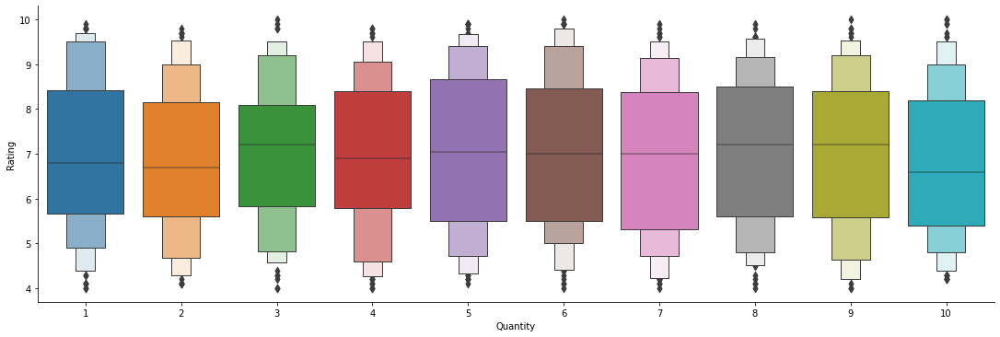

In [ ]:
sns.catplot(y ='Rating',x='Quantity', data = data,kind='boxen',aspect=3) 
plt.xlabel('Quantity')
plt.ylabel('Rating')
plt.show()

In [ ]:
from wordcloud import WordCloud

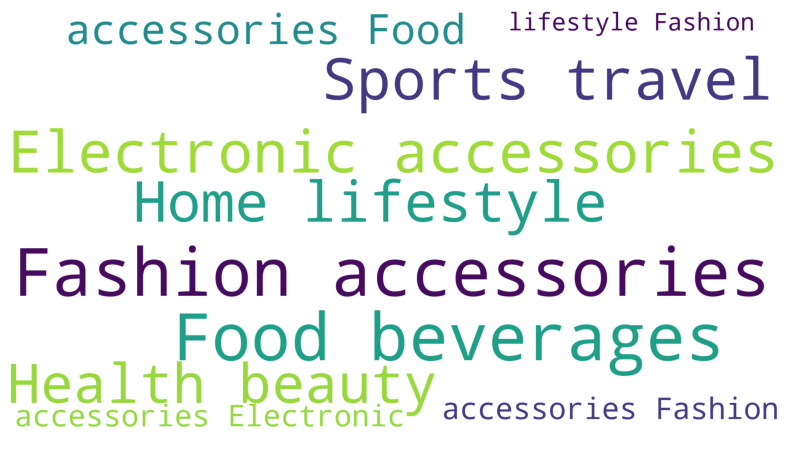

In [ ]:
plt.subplots(figsize=(20,8))
wordcloud = WordCloud(background_color='White',width=1920,height=1080).generate(" ".join(data['Product line']))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('cast.png')
plt.show()

In [ ]:
print("Resumen:")
print(round(data.describe(include=['O']).transpose(),1))

Resumen:
              count unique                  top freq
Invoice ID     1000   1000          530-90-9855    1
Branch         1000      3                    A  340
City           1000      3               Yangon  340
Customer type  1000      2               Member  501
Gender         1000      2               Female  501
Product line   1000      6  Fashion accessories  178
Date           1000     89             2/7/2019   20
Time           1000    506                14:42    7
Payment        1000      3              Ewallet  345


In [ ]:
data.describe(include=['O'])

,Invoice ID,Branch,City,Customer type,Gender,Product line,Date,Time,Payment
count,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,1000,3,3,2,2,6,89,506,3
top,241-96-5076,A,Yangon,Member,Female,Fashion accessories,2/7/2019,14:42,Ewallet
freq,1,340,340,501,501,178,20,7,345


In [ ]:
var_cat = ["City", 'Gender', 'Product line', 'Branch']
data[var_cat].astype('category')
data[var_cat].nunique()
data[var_cat].dtypes

City            object
Gender          object
Product line    object
Branch          object
dtype: object

In [ ]:
#sns.barplot(x='Product line', y='Gender', data=nombrenuestrodatafrmae, ax=axis1)

fig, (axis1, axis2, axis3) = plt.subplots(1,3, figsize=(12,4))
sns.barplot(x='Product line', y='Gender', data=data, ax=axis1)
sns.barplot(x='City', y='Gender', data=data, ax=axis2)
sns.barplot(x='Branch', y='Gender', data=data, ax=axis3);

In [ ]:
columns=['Product line', 'City', 'Branch', 'Gender']
pd.plotting.scatter_matrix(data[columns], figsize=(15, 10));

ValueError: ignored

<Figure size 1080x720 with 0 Axes>

In [ ]:
data.describe(include=['O'])

,Invoice ID,Branch,City,Customer type,Gender,Product line,Date,Time,Payment
count,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,1000,3,3,2,2,6,89,506,3
top,241-96-5076,A,Yangon,Member,Female,Fashion accessories,2/7/2019,14:42,Ewallet
freq,1,340,340,501,501,178,20,7,345


In [ ]:
data.info()
print(" ")
print("Variables Numéricas:")
for i in data.select_dtypes(exclude = ['object']):
    print("\t\t"+i)
    

print("Variables con Texto:")
for i in data.select_dtypes(include = ['object']):
    print("\t\t"+i)
    

print("Variables con Nulos")
missing_val_count = (data.isnull().sum())
print(missing_val_count[missing_val_count > 0])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Invoice ID               1000 non-null   object 
 1   Branch                   1000 non-null   object 
 2   City                     1000 non-null   object 
 3   Customer type            1000 non-null   object 
 4   Gender                   1000 non-null   object 
 5   Product line             1000 non-null   object 
 6   Unit price               1000 non-null   float64
 7   Quantity                 1000 non-null   int64  
 8   Tax 5%                   1000 non-null   float64
 9   Total                    1000 non-null   float64
 10  Date                     1000 non-null   object 
 11  Time                     1000 non-null   object 
 12  Payment                  1000 non-null   object 
 13  cogs                     1000 non-null   float64
 14  gross margin percentage  

#**EDA con PANDAS PROFILING**






In [ ]:
#If you are in a notebook (locally, at LambdaLabs, on Google Colab or Kaggle), you can run:
import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

In [ ]:
#!pip install -U pandas-profiling

In [ ]:
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file
from ipywidgets import widgets
from pathlib import Path

In [ ]:
profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True,html={"style": {"full_width": True}}, sort="None")

In [ ]:
#profile.to_widgets()
profile.to_notebook_iframe()

In [ ]:
profile.to_file(output_file="/content/drive/MyDrive/Colab Notebooks/Pruebaprofile.html")

# **EDA con SWEETVIZ**

In [ ]:
  !pip install sweetviz

     |████████████████████████████████| 15.1MB 289kB/s 
     |████████████████████████████████| 71kB 5.3MB/s 
  Found existing installation: tqdm 4.41.1
    Uninstalling tqdm-4.41.1:
      Successfully uninstalled tqdm-4.41.1


In [ ]:
import sweetviz as sv

In [ ]:
my_report = sv.analyze(data)
my_report.show_html()


Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
